## Analysis and data plotting in seaborn

## Imports

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
#import re

C:\Users\lucav\AppData\Local\Temp\ipykernel_11964\2129830943.py:1: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [3]:
immo = pd.read_csv('../data/clean/details_clean.csv')
#immo = pd.read_csv('../../immo-eliza-analysis-the_chaincoders/details_clean.csv')

pd.set_option('display.max_columns', None) # Displays all the columns


C:\Users\lucav\AppData\Local\Temp\ipykernel_11964\677958950.py:1: DtypeWarning: Columns (88,105,106,118) have mixed types. Specify dtype option on import or set low_memory=False.
  immo = pd.read_csv('../data/clean/details_clean.csv')


## Cleaning

Here we are:
* changing numpy not a number type to None type
* removing some rows which either shouldn't be here (annuity properties) or need further implementation in the scraper (group developments)
* removing substrings to clean up columns for type casting
* dsplaying the first 5 columns of the dataframe

In [4]:
immo = immo.replace(np.nan, None)


# Replace 'Not specified' with None as in this case it serves no purpose. If a consumption is not provided it might as well be absent
immo['Primary energy consumption'] = immo['Primary energy consumption'].replace('Not specified', None)
immo['CO₂ emission'] = immo['CO₂ emission'].replace('Not specified', None)
immo['Yearly theoretical total energy consumption'] = immo['Yearly theoretical total energy consumption'].replace('Not specified', None)


# Remove annuity properties
substring = '€'
filter = immo['Price'].str.contains(substring)
immo = immo[~filter]


# Remove group developments for dataset
immo = immo[
    (immo["Subtype_of_property"] != "New-real-estate-project-houses")
    & (immo["Subtype_of_property"] != "New-real-estate-project-apartments")
]


# Remove substrings from strings
immo['Price'] = immo['Price'].str.replace(r'Starting price : ','')
immo['CO₂ emission'] = immo['CO₂ emission'].str.replace(r' kg CO₂/m²','')
immo['Yearly theoretical total energy consumption'] = immo['Yearly theoretical total energy consumption'].str.replace(r' kWh/year','')
immo['Building price excluding VAT'] = immo['Building price excluding VAT'].str.replace(r'€','')
immo['Building price excluding VAT'] = immo['Building price excluding VAT'].str.replace(r',','')
immo['Total price including taxes*'] = immo['Total price including taxes*'].str.replace(r'€','')
immo['Total price including taxes*'] = immo['Total price including taxes*'].str.replace(r',','')
immo['Street frontage width'] = immo['Street frontage width'].str.replace(r' m','')


immo.head()

,Unnamed: 0,Property_ID,Locality,Price,Subtype_of_property,Type_of_property,Available as of,Neighbourhood or locality,Outdoor parking spaces,Primary energy consumption,Energy class,Reference number of the EPC report,CO₂ emission,Yearly theoretical total energy consumption,Planning permission obtained,Subdivision permit,Possible priority purchase right,Proceedings for breach of planning regulations,Flood zone type,Tenement building,Address,Website,External reference,Postcode,Url,Available date,Construction year,Number of floors,Building condition,Street frontage width,Number of frontages,Covered parking spaces,Surroundings type,Living area,Kitchen type,Bedrooms,Bedroom 1 surface,Bedroom 2 surface,Bedroom 3 surface,Bathrooms,Toilets,Basement,Attic,Furnished,Surface of the plot,Width of the lot on the street,Garden surface,Terrace surface,As built plan,Heating type,Double glazing,Total ground floor buildable,Latest land use designation,Cadastral income,Living room surface,Kitchen surface,Bedroom 4 surface,Office surface,Office,Connection to sewer network,Dining room,Bedroom 5 surface,Shower rooms,Armored door,"Gas, water & electricity",Virtual visit,Basement surface,Dressing room,Professional space,Attic surface,Land is facing street,Wooded land,Plot at rear,Flat land,Garden orientation,Terrace orientation,Conformity certification for fuel tanks,Heat pump,Photovoltaic solar panels,Thermic solar panels,Common water heater,Type of building,Terrace,Laundry room,Isolated,Obligation to build,Unnamed: 86,Agent's name,E-mail,Phone number,Floor,Garden,E-level (overall energy performance),Living room,Property name,Sea view,Building price excluding VAT,Land price excluding taxes,Building VAT,Taxes related to land,Total price including taxes*,How many fireplaces?,Professional space surface,Monthly charges,Number of annexes,EPC description,Extra information,Percentage rented,Current monthly revenue,Value of the property,Lump sum,Monthly annuity,Indexed annuity,Reversionary annuity,Bare ownership sale,Number of annuitants,Age of annuitant,Maximum duration of annuity,Age of annuitants,Venue of the sale,Single session,Terms of visit
1,1,11135548,Ronse,259000,Villa,House,After signing the deed,Vlaamse Ardennen,5.0,471,E,3033404,8899,None,0,0,0,No,Non flood zone,0,Stationstraat 30,None,5847455,9600.0,https://www.immoweb.be/en/classified/villa/for...,May 20 2024 - 12:00 AM,1959.0,2.0,To renovate,10,3.0,1.0,Isolated,165.0,Semi equipped,3.0,14.0,12.0,8.0,1.0,1.0,1,1,0,674.0,None,351.0,30.0,No,Gas,1,95.0,Area of landscape interest,None,None,None,None,None,0,None,0,None,None,None,0,None,None,None,None,None,None,None,None,0,None,None,None,None,None,0,None,None,0,0,None,None,None,None,None,None,None,0,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
6,6,11135545,Zottegem,645000,Villa,House,After signing the deed,Oost-Vlaanderen,4.0,462,E,20230818-0002967446-RES-1,None,None,0,0,0,None,Non flood zone,0,Sint-Denijslaan 1,None,5863623,9620.0,https://www.immoweb.be/en/classified/villa/for...,None,1976.0,1.0,Good,18,4.0,2.0,Urban,272.0,Installed,4.0,17.0,17.0,15.0,1.0,2.0,0,0,0,2627.0,None,2327.0,26.0,None,Fuel oil,1,None,"Living area (residential, urban or rural)",None,53.0,28.0,14.0,12.0,1,Connected,0,None,None,None,0,None,None,None,None,None,None,None,None,0,None,None,None,None,None,0,None,None,0,0,None,None,None,None,None,None,None,0,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
7,7,11135101,Seraing,329000,Mixed-use-building,House,After signing the deed,None,6.0,418,E,20240112001720,None,72247,0,0,0,No,Non flood zone,1,Rue J. Wettinck 49,None,5863385,4100.0,https://www.immoweb.be/en/classified/mixed-use...,None,1900.0,2.0,To renovate,12,2.0,1.0,Isolated,110.0,Not installed,5.0,12.0,18.0,15.0,4.0,4.0,0,0,0,1640.0,None,465.0,45.0,No,Gas,1,1170.0,"Living ar

Here we define some lists with the various column names which we will be type casting

In [5]:
# Should "Construction year" be categorical or numeric?
# Deal with "Unnamed: 85/90" or whatever number it happens to be
# Check "Building VAT"
# Check "EPC description"
# Check "Age of annuitants" (there are multiple) but very few

map_to_int = [
    "Price",
    "Number of floors",
    "Number of frontages",
    "Covered parking spaces",
    "Outdoor parking spaces",
    "Living area",
    "Bedrooms",
    "Bedroom 1 surface",
    "Bedroom 2 surface",
    "Bedroom 3 surface",
    "Bedroom 4 surface",
    "Bedroom 5 surface",
    "Bathrooms",
    "Toilets",
    "Surface of the plot",
    "Width of the lot on the street",
    "Garden surface",
    "Terrace surface",
    "CO₂ emission",
    "Yearly theoretical total energy consumption",
    "Total ground floor buildable",
    "Cadastral income",
    "Shower rooms",
    "Living room surface",
    "Kitchen surface",
    "Office surface",
    "Basement surface",
    "Attic surface",
    "E-level (overall energy performance)",
    "How many fireplaces?",
    "Floor",
    "Professional space surface",
    "Number of annexes",
    "Building price excluding VAT",
    "Number of annuitants",
    "Age of annuitant",
    "Maximum duration of annuity",
    "Percentage rented",
    "Current monthly revenue",
    "Construction year",
    "Postcode"
]

map_to_float = [
    "Street frontage width",
    "Monthly charges",
    "Primary energy consumption",
]

map_to_str = [
    "Property_ID",
    "Construction year",
    "Postcode",
    #"Property name"
]

map_to_binary = [
    "As built plan",
    "Connection to sewer network",
    "Armored door",
    "Dressing room",
    "Virtual visit",
    "Professional space",
    "Proceedings for breach of planning regulations",
    "Land is facing street",
    "Wooded land",
    "Plot at rear",
    "Heat pump",
    "Photovoltaic solar panels",
    "Common water heater",
    "Living room",
    "Garden",
    "Isolated",
    "Obligation to build",
    "Indexed annuity",
    "Reversionary annuity",
    "Bare ownership sale",
    "Sea view",
    "Single session"
]

# Still need to do

map_to_datetime = ["Available date"]


Here we perform the type casting

In [6]:
# Map every column in map_to_int to int

immo[map_to_int] = immo[map_to_int].fillna(-999999)
immo[map_to_int] = immo[map_to_int].astype(int)
immo[map_to_int] = immo[map_to_int].replace(-999999, None)

# Map every colmmn in map_to_float to float
# (and round to 2 decimals because "Primary energy consumption" was in scientific notation)

immo[map_to_float] = immo[map_to_float].astype(float).round(2)


# Map every column in map_to_str to string
# Not sure if 'Property name' should be kept/mapped, as some names are just '1', '3' and now 'None'

immo[map_to_str] = immo[map_to_str].astype(str)

# Need to map date time


C:\Users\lucav\AppData\Local\Temp\ipykernel_11964\3554665741.py:3: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  immo[map_to_int] = immo[map_to_int].fillna(-999999)


## Seaborn fun

In [7]:
immo.head(10)

immo.tail(10)

,Unnamed: 0,Property_ID,Locality,Price,Subtype_of_property,Type_of_property,Available as of,Neighbourhood or locality,Outdoor parking spaces,Primary energy consumption,Energy class,Reference number of the EPC report,CO₂ emission,Yearly theoretical total energy consumption,Planning permission obtained,Subdivision permit,Possible priority purchase right,Proceedings for breach of planning regulations,Flood zone type,Tenement building,Address,Website,External reference,Postcode,Url,Available date,Construction year,Number of floors,Building condition,Street frontage width,Number of frontages,Covered parking spaces,Surroundings type,Living area,Kitchen type,Bedrooms,Bedroom 1 surface,Bedroom 2 surface,Bedroom 3 surface,Bathrooms,Toilets,Basement,Attic,Furnished,Surface of the plot,Width of the lot on the street,Garden surface,Terrace surface,As built plan,Heating type,Double glazing,Total ground floor buildable,Latest land use designation,Cadastral income,Living room surface,Kitchen surface,Bedroom 4 surface,Office surface,Office,Connection to sewer network,Dining room,Bedroom 5 surface,Shower rooms,Armored door,"Gas, water & electricity",Virtual visit,Basement surface,Dressing room,Professional space,Attic surface,Land is facing street,Wooded land,Plot at rear,Flat land,Garden orientation,Terrace orientation,Conformity certification for fuel tanks,Heat pump,Photovoltaic solar panels,Thermic solar panels,Common water heater,Type of building,Terrace,Laundry room,Isolated,Obligation to build,Unnamed: 86,Agent's name,E-mail,Phone number,Floor,Garden,E-level (overall energy performance),Living room,Property name,Sea view,Building price excluding VAT,Land price excluding taxes,Building VAT,Taxes related to land,Total price including taxes*,How many fireplaces?,Professional space surface,Monthly charges,Number of annexes,EPC description,Extra information,Percentage rented,Current monthly revenue,Value of the property,Lump sum,Monthly annuity,Indexed annuity,Reversionary annuity,Bare ownership sale,Number of annuitants,Age of annuitant,Maximum duration of annuity,Age of annuitants,Venue of the sale,Single session,Terms of visit
18203,19909,11113755,Schoten,439000,House,House,After signing the deed,None,1,342.0,D,20230115-0002652063-RES--2,None,None,1,0,0,No,Non flood zone,0,Kloosterstraat 89-93,None,132730 - LIE-23-PLE-,2900,https://www.immoweb.be/en/classified/house/for...,None,None,None,Good,NaN,2,1,None,250,None,4,None,None,None,2,3,1,0,0,172,None,None,None,No,None,1,None,"Living area (residential, urban or rural)",None,42,None,None,None,0,None,0,None,None,None,0,None,None,None,None,None,None,None,None,0,West,None,None,None,None,0,None,None,0,0,None,None,None,None,None,None,None,1,None,None,None,None,None,None,None,None,None,None,None,NaN,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
18204,19910,11113753,Zandvliet,365000,House,House,After signing the deed,None,2,425.0,E,20210309-0002384606-RES-1,1000,None,1,0,0,No,Non flood zone,0,Kloosterstraat 89-93,None,132734 - EKE-23-SSW-,2040,https://www.immoweb.be/en/classified/house/for...,None,1968,None,Good,NaN,3,1,None,207,Installed,3,None,None,None,1,None,1,0,0,317,None,None,None,No,Gas,1,None,"Living area (residential, urban or rural)",None,None,None,None,None,0,None,0,None,None,None,0,None,None,None,None,None,None,None,None,0,East,None,None,None,None,0,None,None,0,0,None,None,None,None,None,None,None,1,None,None,None,None,None,None,None,None,None,None,None,NaN,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
18205,19911,11113752,Hoevenen,329000,House,House,After signing the deed,None,None,340.0,D,Certificaat-20230731-0002954810-RES-1.pdf,None,None,1,0,0,No,Non flood zone,0,Kloosterstraat 89-93,None,132729 - EKE-23-SSW-,2940,https://www.immoweb.be/en/classified/house/for...,None,1969,None,Good,6.0,3,None,None,164,Installed,5,None,None,None,2,3,0,0,0,252,None,None,None,No,Gas,1,None,"Living area (residential

**Energy vs Price**

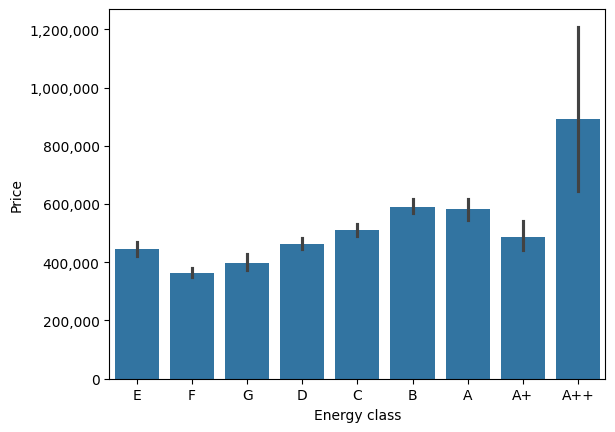

In [8]:
#avg_price = immo.groupby(by= ["Energy class"])["Price"].mean()

filtered_energy = immo[~immo['Energy class'].isin(['Not specified', 'F_C', 'A+_A++'])]

sns.barplot(filtered_energy, x = 'Energy class', y='Price', legend=False)

# Get the current axis (matplotlib axis object)
ax = plt.gca()

# Format the y-axis labels as integers
ax.get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))

# Show the plot
plt.show()


<BarContainer object of 15117 artists>

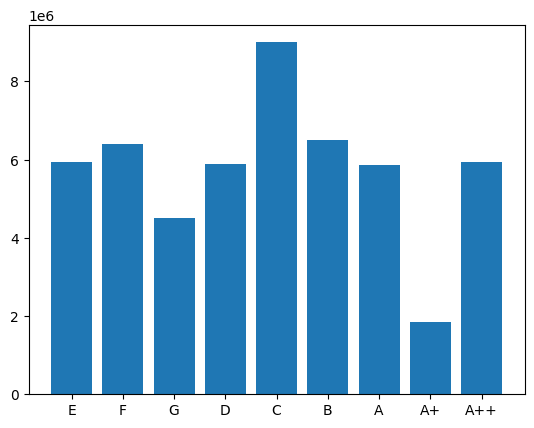

In [9]:
filtered_energy = immo[~immo['Energy class'].isin(['Not specified', 'F_C', 'A+_A++'])]

fig, ax = plt.subplots()

ax.bar(filtered_energy['Energy class'], filtered_energy['Price'])

**Living area vs Price**

C:\Users\lucav\AppData\Local\Temp\ipykernel_11964\2211795517.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_surfaces['Surface of the plot'] = pd.to_numeric(filtered_surfaces['Surface of the plot'])


1           674
6          2627
7          1640
8           650
9           442
10          333
11          510
14          571
15         1382
16         4153
17          555
18          601
19          100
20          317
22          179
28         1333
29          600
30         1333
34          704
36          179
37         1703
38          348
42         1500
43        43885
44         1509
45          733
46          176
47          745
49         1865
50          570
54          802
55           27
58          215
59          368
60           91
61          261
62          309
63           81
64           83
65           90
66         1921
67           65
68         1740
71          721
73          110
74          750
75          600
76          414
77          290
78          290
79          230
80           80
82         2116
83          168
84          270
85          270
88          437
89          504
90          385
92          312
94          260
95          724
96      

<Axes: xlabel='Surface of the plot', ylabel='Price'>

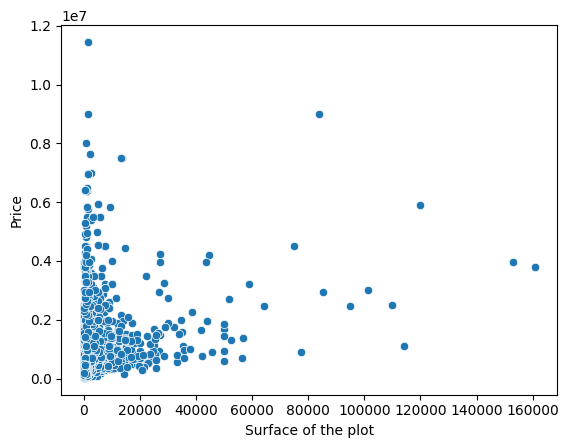

In [20]:
#surfaces = immo["Surface of the plot"]
#filtered_surf = immo[immo["Surface of the plot"].notna()]
# filtered_surf = immo[immo["Surface of the plot"] != 0]
# print(filtered_surf['Surface of the plot'])
# print(filtered_surf["Surface of the plot"].dtype)

# Drop rows with None values in the 'Surface of the plot' column
filtered_surfaces = immo.dropna(subset=['Surface of the plot'])

# Convert the column to numeric type if it's not already
filtered_surfaces['Surface of the plot'] = pd.to_numeric(filtered_surfaces['Surface of the plot'])

filtered_surfaces = filtered_surfaces[filtered_surfaces['Surface of the plot'] < 800000]

filtered_surfaces= filtered_surfaces[filtered_surfaces['Surface of the plot'] != None]

print(filtered_surfaces["Surface of the plot"])

sns.scatterplot(data= filtered_surfaces, x = "Surface of the plot", y = "Price")

**Price and bedrooms**

<Axes: xlabel='Bedrooms', ylabel='Price'>

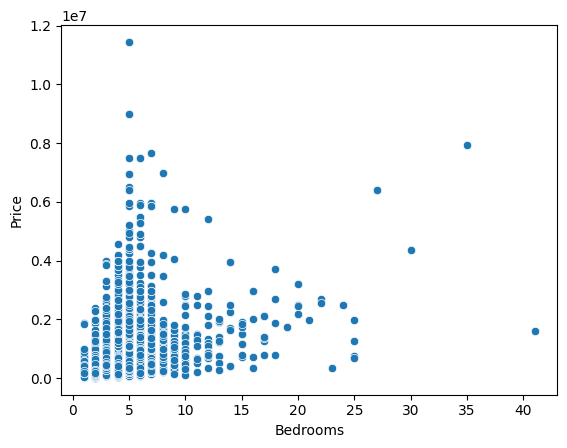

In [11]:
sns.scatterplot(immo, x = "Bedrooms", y = "Price")

**Construction year and price**

([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32,
  33,
  34,
  35,
  36,
  37,
  38,
  39,
  40,
  41,
  42,
  43,
  44,
  45,
  46,
  47,
  48,
  49,
  50,
  51,
  52,
  53,
  54,
  55,
  56,
  57,
  58,
  59,
  60,
  61,
  62,
  63,
  64,
  65,
  66,
  67,
  68,
  69,
  70,
  71,
  72,
  73,
  74,
  75,
  76,
  77,
  78,
  79,
  80,
  81,
  82,
  83,
  84,
  85,
  86,
  87,
  88,
  89,
  90,
  91,
  92,
  93,
  94,
  95,
  96,
  97,
  98,
  99,
  100,
  101,
  102,
  103,
  104,
  105,
  106,
  107,
  108,
  109,
  110,
  111,
  112,
  113,
  114,
  115,
  116,
  117,
  118,
  119,
  120,
  121,
  122,
  123,
  124,
  125,
  126,
  127,
  128,
  129,
  130,
  131,
  132,
  133,
  134,
  135,
  136,
  137,
  138,
  139,
  140,
  141,
  142,
  143,
  144,
  145,
  146,
  147,
  148,
  149,
  150,
  151,
  152,
  153,
  154,
  155,
  156,
  157,
  15

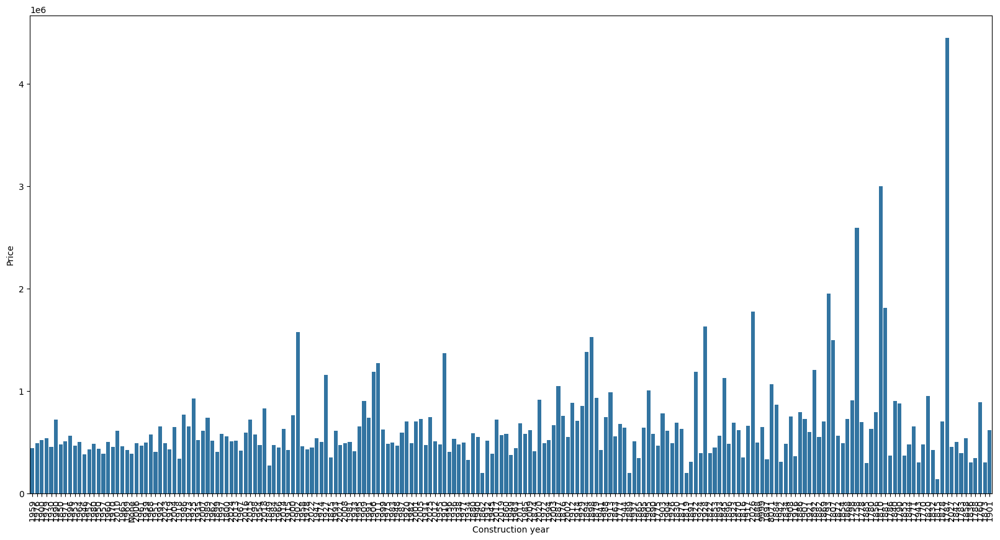

In [26]:
plt.figure(figsize=(20, 10))
sns.barplot(immo, x ="Construction year", y= "Price", errorbar=None)
plt.xticks(rotation=90)

## Testing cells below

In [13]:
#immo[map_to_float] = immo[map_to_float].fillna(-999999)


for i in map_to_str:
    print(i)
    immo[i] = immo[i].astype(str)
    
#immo[map_to_float] = immo[map_to_float].replace(-999999, None)

Property_ID
Construction year
Postcode


In [14]:
pd.set_option("display.max_rows", None)

In [15]:
immo["Postcode"].value_counts()

Postcode
9000    319
8300    311
1180    219
1000    189
1050    174
4000    170
9600    159
2100    145
2300    143
8400    140
4100    138
9800    128
2800    126
1030    126
9500    126
1070    118
2000    113
9700    109
8000    107
1410    104
9300    104
8800    101
1150     99
2660     97
8870     96
4020     96
2930     91
2018     89
8500     85
3000     82
4400     81
1080     81
8370     79
7700     79
9940     77
2830     77
4500     76
1200     76
9200     76
2600     75
1020     73
9040     73
8670     73
1420     73
8310     73
4800     69
None     69
1190     68
2500     67
2610     66
9900     66
1400     65
2170     65
1060     65
9100     65
8420     64
8790     64
1040     61
1300     60
4040     60
2060     60
1800     60
9230     59
9400     59
9050     58
3500     58
7100     57
9660     57
3300     57
1380     56
2360     56
1500     55
6700     53
2900     53
1640     53
2970     52
8620     52
1090     51
8430     50
2140     49
5000     49
9890     49
5100   

In [16]:
a = immo[immo["Postcode"] == 'None']
a[['Property_ID', 'Postcode']]

,Property_ID,Postcode
1342,11137959,None
2638,10487832,None
2731,11136190,None
3246,11135521,None
3247,11135520,None
3248,11135519,None
3249,11135518,None
3251,11135513,None
4726,11133320,None
4729,11133112,None


In [17]:
# Loop over columns to find out which ones are empty
#len(immo["Number of annuitants"].value_counts())

In [18]:
columns = immo.columns

for column in immo.columns:
    immo_test = immo[immo[column] == 'None']
    print(column)
    print(immo_test,'\n')
#immo = immo[(immo["Subtype_of_property"] != "New-real-estate-project-houses")]
#print(columns)

Unnamed: 0
Empty DataFrame
Columns: [Unnamed: 0, Property_ID, Locality, Price, Subtype_of_property, Type_of_property, Available as of, Neighbourhood or locality, Outdoor parking spaces, Primary energy consumption, Energy class, Reference number of the EPC report, CO₂ emission, Yearly theoretical total energy consumption, Planning permission obtained, Subdivision permit, Possible priority purchase right, Proceedings for breach of planning regulations, Flood zone type, Tenement building, Address, Website, External reference, Postcode, Url, Available date, Construction year, Number of floors, Building condition, Street frontage width, Number of frontages, Covered parking spaces, Surroundings type, Living area, Kitchen type, Bedrooms, Bedroom 1 surface, Bedroom 2 surface, Bedroom 3 surface, Bathrooms, Toilets, Basement, Attic, Furnished, Surface of the plot, Width of the lot on the street, Garden surface, Terrace surface, As built plan, Heating type, Double glazing, Total ground floor buil

In [19]:
#sns.heatmap(immo.corr());